In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/ppe-detection/README.dataset.txt
/kaggle/input/ppe-detection/README.roboflow.txt
/kaggle/input/ppe-detection/data.yaml
/kaggle/input/ppe-detection/valid/labels/ppe_0074_jpg.rf.2f2149d96e883f3cce782e5f5fa89bf0.txt
/kaggle/input/ppe-detection/valid/labels/image_1589_jpg.rf.d5ae14da617c1cefc92fd4ed808d2a77.txt
/kaggle/input/ppe-detection/valid/labels/image_472_jpg.rf.1287c8b64f9f1a20912cefa0e63ee624.txt
/kaggle/input/ppe-detection/valid/labels/construction-crack-146741_jpg.rf.4fdc3efe45e80db875e7aa9d5fe4c514.txt
/kaggle/input/ppe-detection/valid/labels/ppe_0494_jpg.rf.56f639e63a4dd81ca4eb920cf04f634b.txt
/kaggle/input/ppe-detection/valid/labels/Video2_5_jpg.rf.8c6e6fcb969157359bd5c01f4b710edb.txt
/kaggle/input/ppe-detection/valid/labels/image_261_jpg.rf.617bc1c0f554460d829a501bcce59e0d.txt
/kaggle/input/ppe-detection/valid/labels/ppe_0581_jpg.rf.e804e22282b5af4569e1aefb846ef993.txt
/kaggle/input/ppe-detection/valid/labels/20220621_132901_jpg.rf.f2137ff75f6ccefd72e8e977be95cc

In [3]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 28.7 MB/s eta 0:00:0000:01


In [4]:
import ultralytics
ultralytics.checks()

Ultralytics 8.4.8 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 6634.1/8062.4 GB disk)


In [5]:
from ultralytics import YOLO
from IPython.display import display, Image

#Editing yaml file

1.checking

2.copying to working editable directory

3.editing

4.check

In [6]:
#checking file exist
!ls /kaggle/input

ppe-detection


In [7]:
#copy
!cp /kaggle/input/ppe-detection/data.yaml /kaggle/working/data.yaml

In [8]:
#config
import yaml

yaml_path = "/kaggle/working/data.yaml"   # or config.yml

with open(yaml_path, "r") as f:
    data = yaml.safe_load(f)

print(data)


{'train': '../train/images', 'val': '../valid/images', 'test': '../test/images', 'nc': 10, 'names': ['boots', 'gloves', 'goggles', 'helmet', 'no-boots', 'no-gloves', 'no-goggles', 'no-helmet', 'no-vest', 'vest'], 'roboflow': {'workspace': 'testcasque', 'project': 'ppe-detection-qlq3d', 'version': 1, 'license': 'CC BY 4.0', 'url': 'https://universe.roboflow.com/testcasque/ppe-detection-qlq3d/dataset/1'}}


In [ ]:
#editing
data["path"] = "/kaggle/input/ppe-detection"

# optional but recommended
data["train"] = "/kaggle/input/ppe-detection/train/images"
data["val"] = "/kaggle/input/ppe-detection/valid/images"
data["test"]= "/kaggle/input/ppe-detection/test/images"

# if test exists
# data["test"] = "images/test"


#6.checking

In [10]:
with open(yaml_path, "w") as f:
    yaml.dump(data, f, sort_keys=False)

print("YAML updated for Kaggle ✅")

YAML updated for Kaggle ✅


In [11]:
!cat /kaggle/working/data.yaml


train: /kaggle/input/ppe-detection/train/images
val: /kaggle/input/ppe-detection/valid/images
test: /kaggle/input/ppe-detection/test/images
nc: 10
names:
- boots
- gloves
- goggles
- helmet
- no-boots
- no-gloves
- no-goggles
- no-helmet
- no-vest
- vest
roboflow:
  workspace: testcasque
  project: ppe-detection-qlq3d
  version: 1
  license: CC BY 4.0
  url: https://universe.roboflow.com/testcasque/ppe-detection-qlq3d/dataset/1
path: /kaggle/input/your-dataset-name


In [12]:
!yolo task=detect mode=train data=/kaggle/working/data.yaml model="yolo11n.pt" epochs=50 imgsz=640

Ultralytics 8.4.8 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, persp

#Visualization

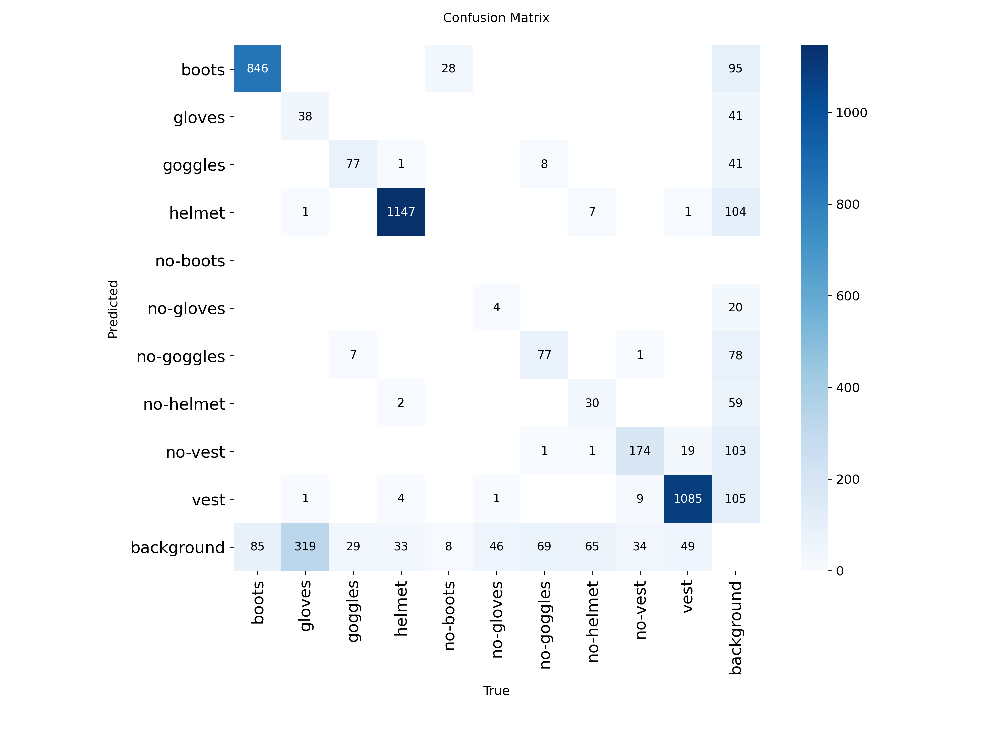

In [13]:
Image("/kaggle/working/runs/detect/train/confusion_matrix.png", width=600)

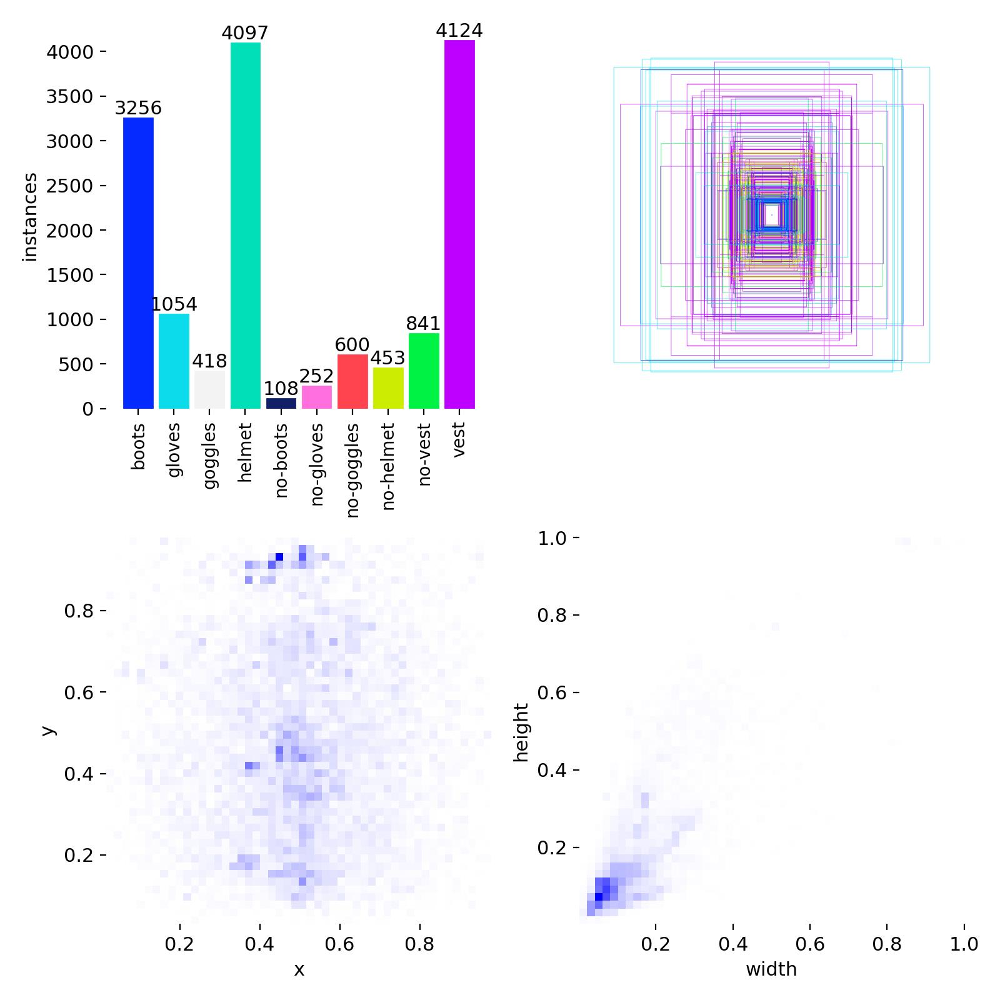

In [14]:
Image("/kaggle/working/runs/detect/train/labels.jpg", width=600)

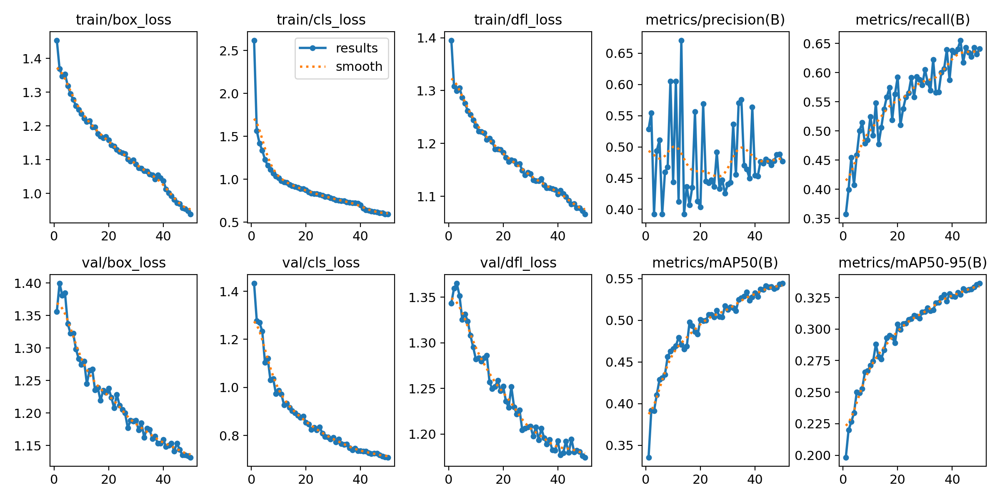

In [15]:
Image("/kaggle/working/runs/detect/train/results.png", width=600)

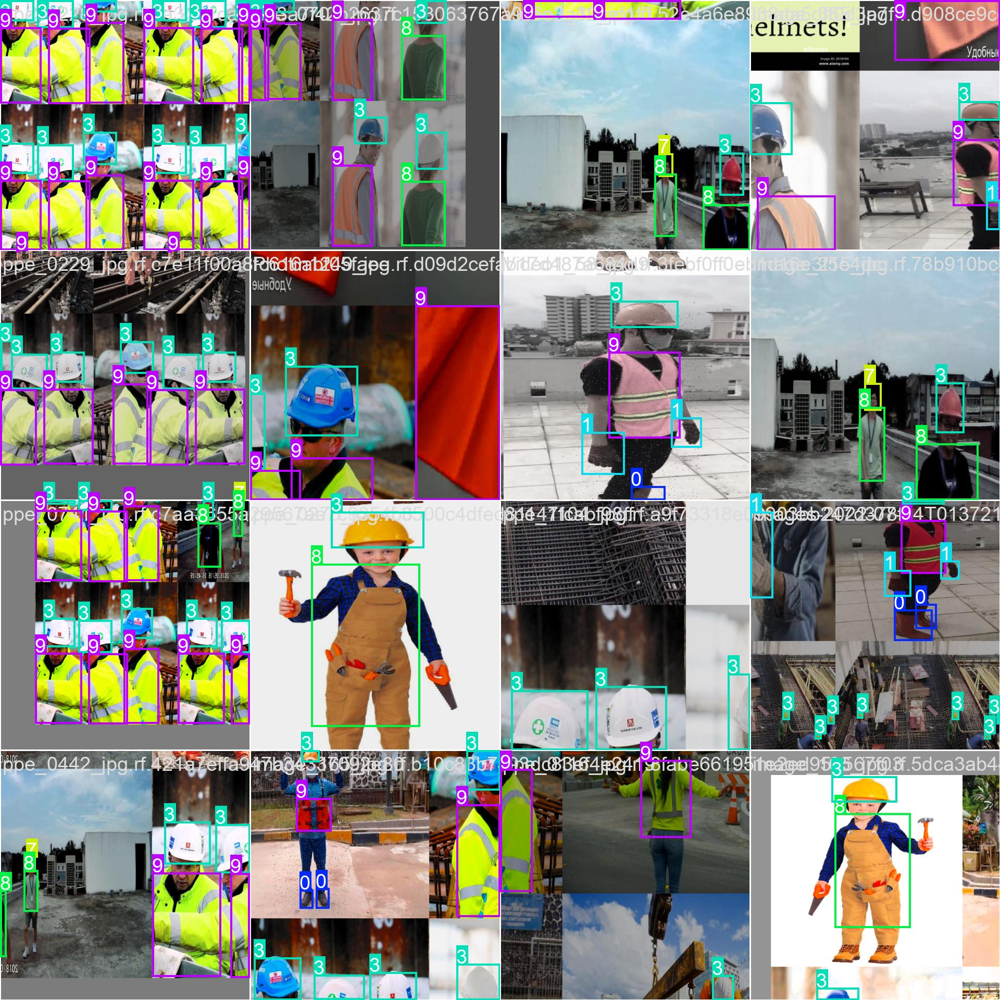

In [16]:
Image("/kaggle/working/runs/detect/train/train_batch0.jpg", width=600)

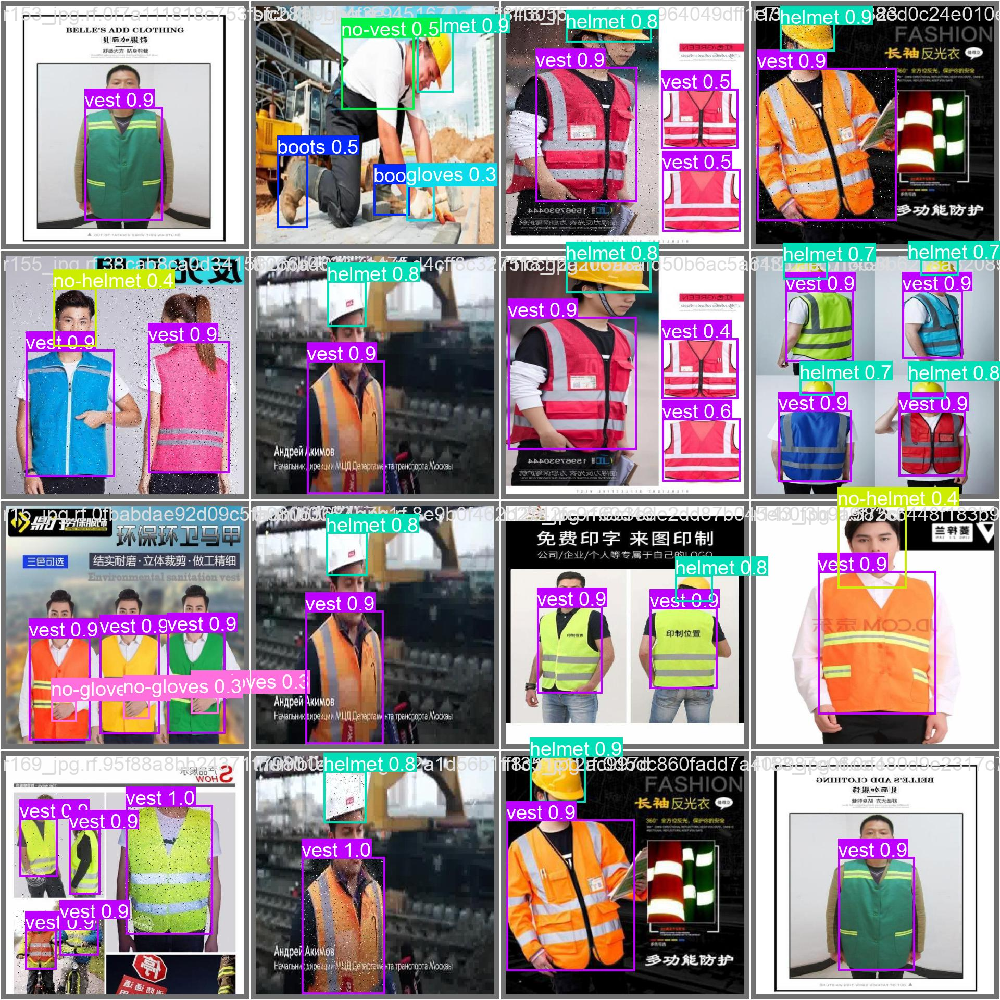

In [17]:
Image("/kaggle/working/runs/detect/train/val_batch0_pred.jpg", width=600)

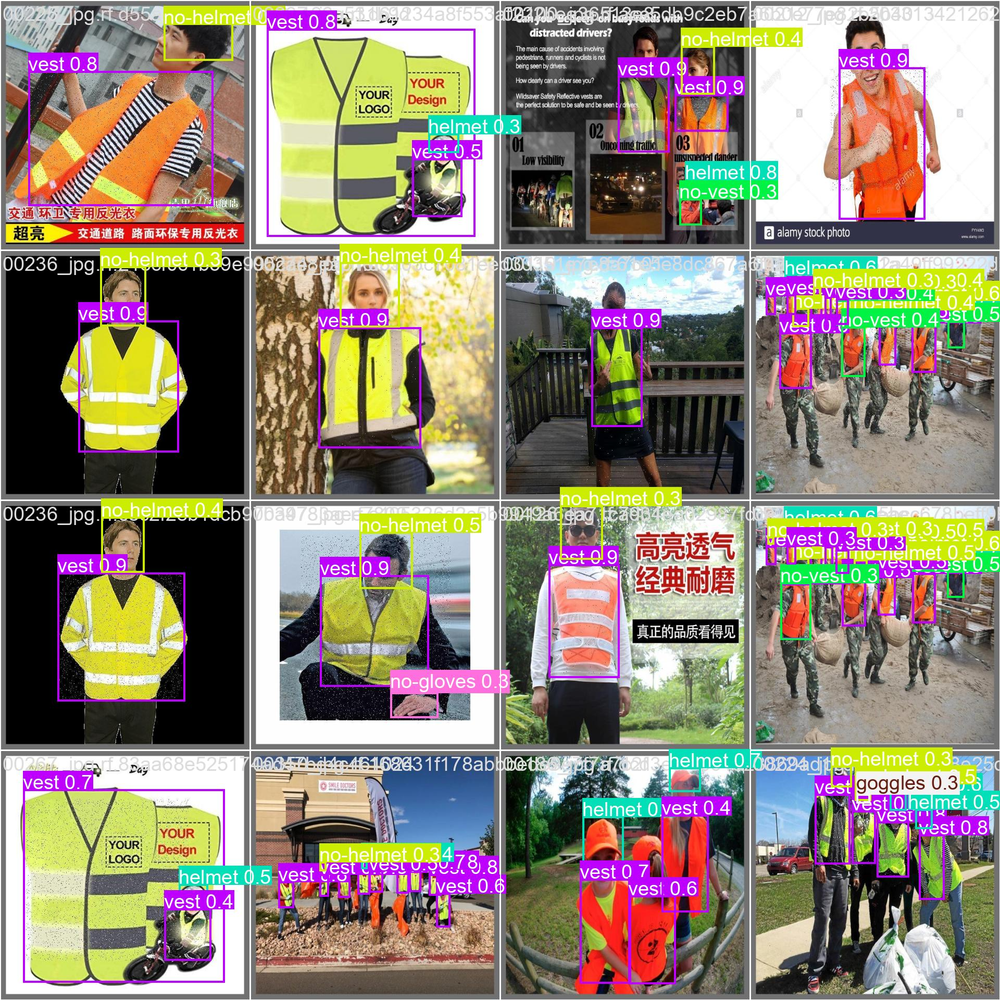

In [18]:
Image("/kaggle/working/runs/detect/train/val_batch1_pred.jpg", width=600)

#Validation

In [19]:
!yolo task=detect mode=val model="/kaggle/working/runs/detect/train/weights/best.pt" data=/kaggle/working/data.yaml

Ultralytics 8.4.8 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLO11n summary (fused): 101 layers, 2,584,102 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 124.2±90.5 MB/s, size: 74.3 KB)
val: Scanning /kaggle/input/ppe-detection/valid/labels... 1026 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1026/1026 783.2it/s 1.3s1s
WARNING ⚠️ val: Cache directory /kaggle/input/ppe-detection/valid is not writable, cache not saved.
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 36, len(boxes) = 4307. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 65/65 7.2it/s 9.0s0.1s
                   all       1026       4307       0.48      0.636      0.544      0.336
        

In [20]:
!yolo task=detect mode=predict model="/kaggle/working/runs/detect/train/weights/best.pt" conf=0.25 source=/kaggle/input/ppe-detection/test/images save=True

Ultralytics 8.4.8 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLO11n summary (fused): 101 layers, 2,584,102 parameters, 0 gradients, 6.3 GFLOPs

image 1/517 /kaggle/input/ppe-detection/test/images/00011_jpg.rf.f0172773f4f585fab51e32c2fdb6c189.jpg: 640x640 2 no-helmets, 2 vests, 9.0ms
image 2/517 /kaggle/input/ppe-detection/test/images/00048_jpg.rf.65a252196defed676f4b1940fae3eec5.jpg: 640x640 1 helmet, 2 vests, 9.1ms
image 3/517 /kaggle/input/ppe-detection/test/images/00100_jpg.rf.87e0894580a4f957424704b89d2d1451.jpg: 640x640 1 helmet, 1 no-helmet, 1 no-vest, 2 vests, 9.5ms
image 4/517 /kaggle/input/ppe-detection/test/images/00121_jpg.rf.7479b44c742de497acf7d4ec8225e9a5.jpg: 640x640 1 helmet, 2 no-goggless, 1 vest, 8.8ms
image 5/517 /kaggle/input/ppe-detection/test/images/00121_jpg.rf.7c441e991513d70ff9e83ce51f6cb0dc.jpg: 640x640 1 helmet, 2 no-goggless, 1 vest, 10.0ms
image 6/517 /kaggle/input/ppe-detection/test/images/00121_jpg.rf.a2c8327479b4d3b52c461

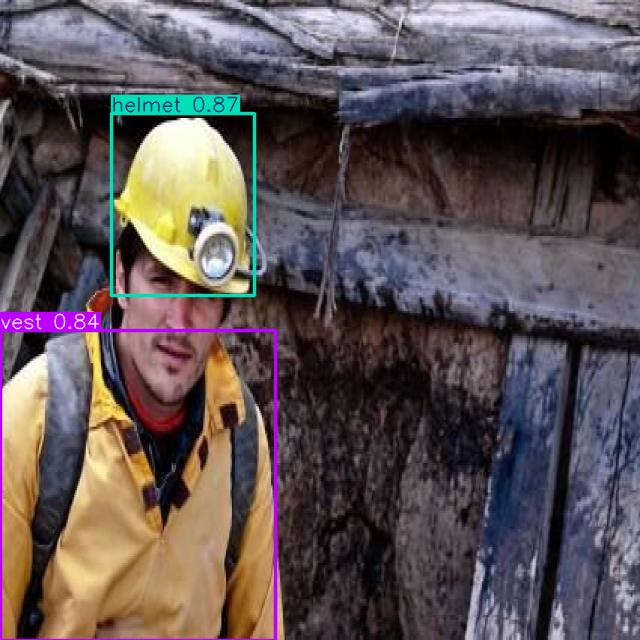

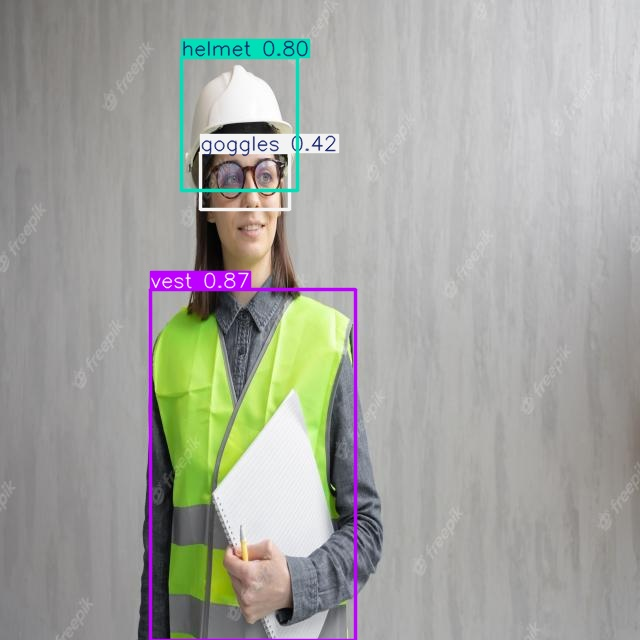

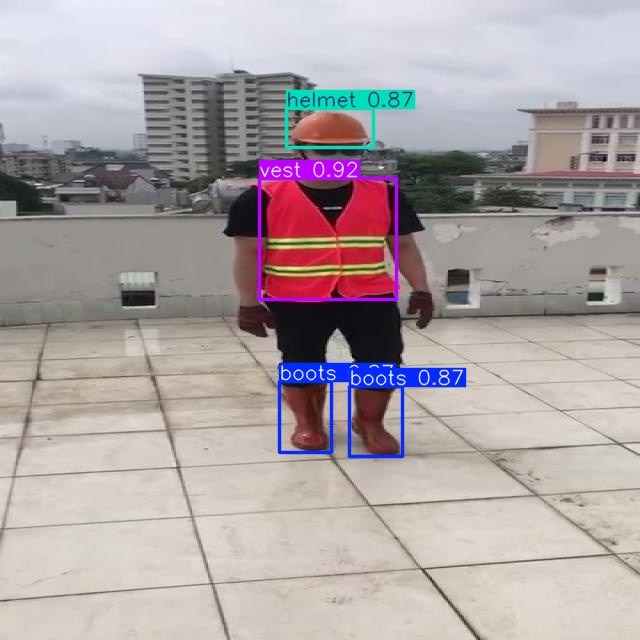

In [21]:
import glob
import os
from IPython.display import Image as IPyImage, display

latest_folder = max(glob.glob('/kaggle/working/runs/detect/predict*/'), key=os.path.getmtime)
for img in glob.glob(f'{latest_folder}/*.jpg')[1:4]:
    display(IPyImage(filename=img, width=600))
    print("\n")

In [22]:
!gdown "https://drive.google.com/uc?id=1ACZp9gmtjEdIY-SHp8K0xdR0D8Gjd3j3&confirm=t"


Downloading...
From: https://drive.google.com/uc?id=1ACZp9gmtjEdIY-SHp8K0xdR0D8Gjd3j3&confirm=t
To: /kaggle/working/image2.jpg
100%|██████████████████████████████████████| 77.7k/77.7k [00:00<00:00, 75.2MB/s]


In [23]:
!yolo task=detect mode=predict model= "/kaggle/working/runs/detect/train/weights/best.pt" conf=0.25 source=image2.jpg save=True

Ultralytics 8.4.8 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLO11n summary (fused): 101 layers, 2,584,102 parameters, 0 gradients, 6.3 GFLOPs

image 1/1 /kaggle/working/image2.jpg: 640x640 2 helmets, 3 vests, 12.3ms
Speed: 3.7ms preprocess, 12.3ms inference, 22.0ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /kaggle/working/runs/detect/predict2
💡 Learn more at https://docs.ultralytics.com/modes/predict


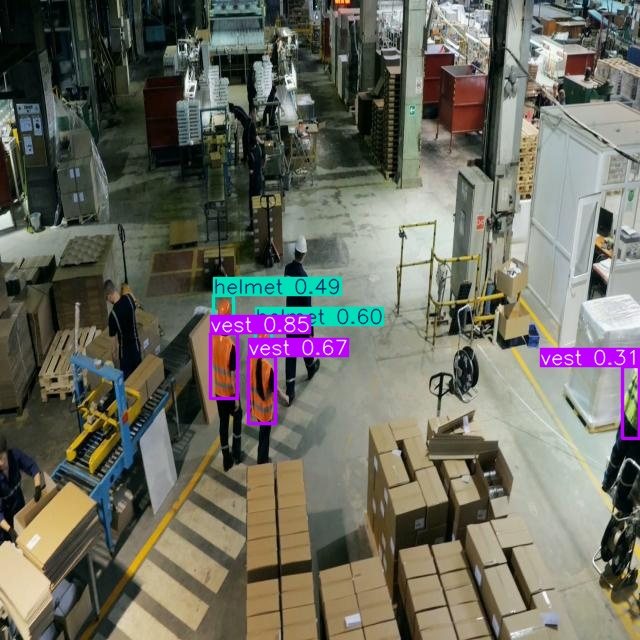

In [24]:
Image("/kaggle/working/runs/detect/predict2/image2.jpg", width=600)

#Custom Model Videos

In [25]:
!gdown "https://drive.google.com/uc?id=1Nyl18zr7zOJHh8uHtSic3dsJSY4LI_t-&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=1Nyl18zr7zOJHh8uHtSic3dsJSY4LI_t-&confirm=t
To: /kaggle/working/PPE_Part1.mp4
100%|██████████████████████████████████████| 14.2M/14.2M [00:00<00:00, 55.3MB/s]


In [26]:
!gdown "https://drive.google.com/uc?id=1SxcrDanPAr-PZfJjWBxoa2t8lUSM2dZn&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=1SxcrDanPAr-PZfJjWBxoa2t8lUSM2dZn&confirm=t
To: /kaggle/working/PPE_Part2.mp4
100%|██████████████████████████████████████| 11.1M/11.1M [00:00<00:00, 48.7MB/s]


In [27]:
!yolo task=detect mode=predict model= "/kaggle/working/runs/detect/train/weights/best.pt" conf=0.25 source="PPE_Part1.mp4" save=True

Ultralytics 8.4.8 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLO11n summary (fused): 101 layers, 2,584,102 parameters, 0 gradients, 6.3 GFLOPs

video 1/1 (frame 1/310) /kaggle/working/PPE_Part1.mp4: 384x640 (no detections), 76.9ms
video 1/1 (frame 2/310) /kaggle/working/PPE_Part1.mp4: 384x640 (no detections), 10.0ms
video 1/1 (frame 3/310) /kaggle/working/PPE_Part1.mp4: 384x640 (no detections), 17.9ms
video 1/1 (frame 4/310) /kaggle/working/PPE_Part1.mp4: 384x640 (no detections), 9.7ms
video 1/1 (frame 5/310) /kaggle/working/PPE_Part1.mp4: 384x640 2 helmets, 13.4ms
video 1/1 (frame 6/310) /kaggle/working/PPE_Part1.mp4: 384x640 2 helmets, 1 no-vest, 11.5ms
video 1/1 (frame 7/310) /kaggle/working/PPE_Part1.mp4: 384x640 2 helmets, 9.6ms
video 1/1 (frame 8/310) /kaggle/working/PPE_Part1.mp4: 384x640 1 helmet, 9.7ms
video 1/1 (frame 9/310) /kaggle/working/PPE_Part1.mp4: 384x640 2 helmets, 1 no-vest, 9.7ms
video 1/1 (frame 10/310) /kaggle/working/PPE_Part1.mp

In [28]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = '/kaggle/working/runs/detect/predict3/PPE_Part1.avi'

# Compressed video path
compressed_path = "/kaggle/working/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab